# **<center>Plant Identification & Transfer learning</center>**

In [512]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# Exploratory Data Analysis

### Extract date from metadata

In [168]:
import os
from tensorflow.keras.utils import to_categorical
import pandas as pd
from datetime import datetime
from PIL import Image
from PIL.ExifTags import TAGS
dir_path = '/Users/Downloads/MyAlbums/الكيلو ٨'
def get_date(dir_path):
    df = pd.DataFrame()
    year = []
    month = []
    day = []
    classes = []
    list_dir = [x for x in os.listdir(dir_path) if not x.startswith('.')]
    for group in list_dir:
        group_path = os.path.join(dir_path,group)
        for img in os.listdir(group_path):
            if not img.startswith('.'):
                img_path = os.path.join(group_path,img)
                img = Image.open(img_path)
                exifdata = img.getexif()
                date = datetime.strptime(exifdata.get(306), '%Y:%m:%d %H:%M:%S')
                year.append(date.year)
                month.append(date.month)
                day.append(date.day)
                classes.append(group)
    df['classes'] = classes
    df['year'] = year
    df['month'] = month
    df['day'] = day
    return df

df = get_date(dir_path)
df.head()

,classes,year,month,day
0,Fagonia arabica,2024,1,20
1,Fagonia arabica,2024,1,20
2,Fagonia arabica,2024,1,20
3,Fagonia arabica,2024,1,20
4,Fagonia arabica,2024,1,20


In [156]:
df.classes = pd.Categorical(df.classes)

In [158]:
to_categorical(df.classes.cat.codes)

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.]])

In [160]:
df['classes'].value_counts()

classes
Ochradenus baccatus    332
Fagonia arabica        224
Fagonia mollis         181
Lycium shawii          135
Name: count, dtype: int64

In [170]:
import cv2
def load_scale(dir_path, flag='Gray', image_size=225, scaler=255):
    """
    Parameters:
    dir_path (str): The absolute path to the directory containing all the dataset classes.
    flag (str): Specifies which color channels to use for storing the image; accepted values are 'BGR', 'RGB', or 'GRAY'..
    
    Returns:
    tuple: A tuple containing two elements. The first is a list of classes names, and the second is a dictionary where the keys are class indices
    from the classes list and the values are the rescaled images belonging to each class.
    """
    classes = [x for x in os.listdir(dir_path) if not x.startswith('.')]
    data = {}
    image_list = []
    class_list = []
    for group in classes:
        group_path = os.path.join(dir_path, group)
        for image_str in os.listdir(group_path):
            image_path = os.path.join(group_path, image_str)
            try:
                image = cv2.imread(image_path)
                if flag == 'BGR':
                    pass
                elif flag == 'RGB':
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                elif flag == 'GRAY':
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)                    
            except:
                pass
            try:
                image = cv2.resize(image, (image_size,image_size))
                image = image/scaler
                image_list.append(image)
                class_list.append(group)
            except:
                pass
        data['images'] = image_list
        data['class'] = class_list        
    return classes, data

classes , data = load_scale(dir_path, flag='RGB')

In [171]:
image_df = pd.DataFrame(data)

In [172]:
image_df['class'].value_counts()

class
Ochradenus baccatus    332
Lycium shawii          254
Fagonia arabica        224
Fagonia mollis         181
Name: count, dtype: int64

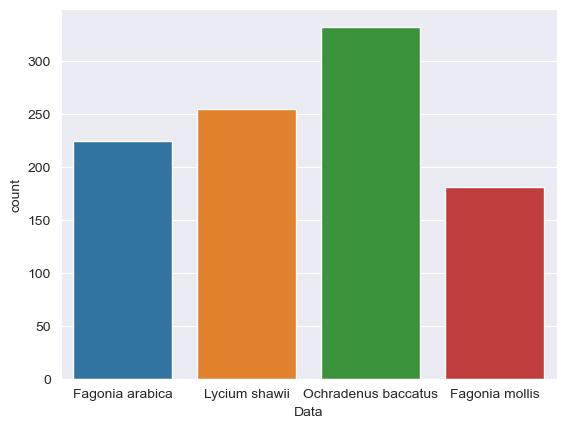

In [173]:
import seaborn as sns
import matplotlib.pyplot as plt
def classes_visualize(data, x_label):
    sns.set_style('darkgrid')
    g = sns.countplot(x=data[1]['class'], hue=data[1]['class'])
    g.set_xticks(list(range(len(data[0]))))
    g.set_xticklabels(data[0])
    plt.xlabel(x_label)
    plt.show()

classes_visualize((classes , data),'Data')

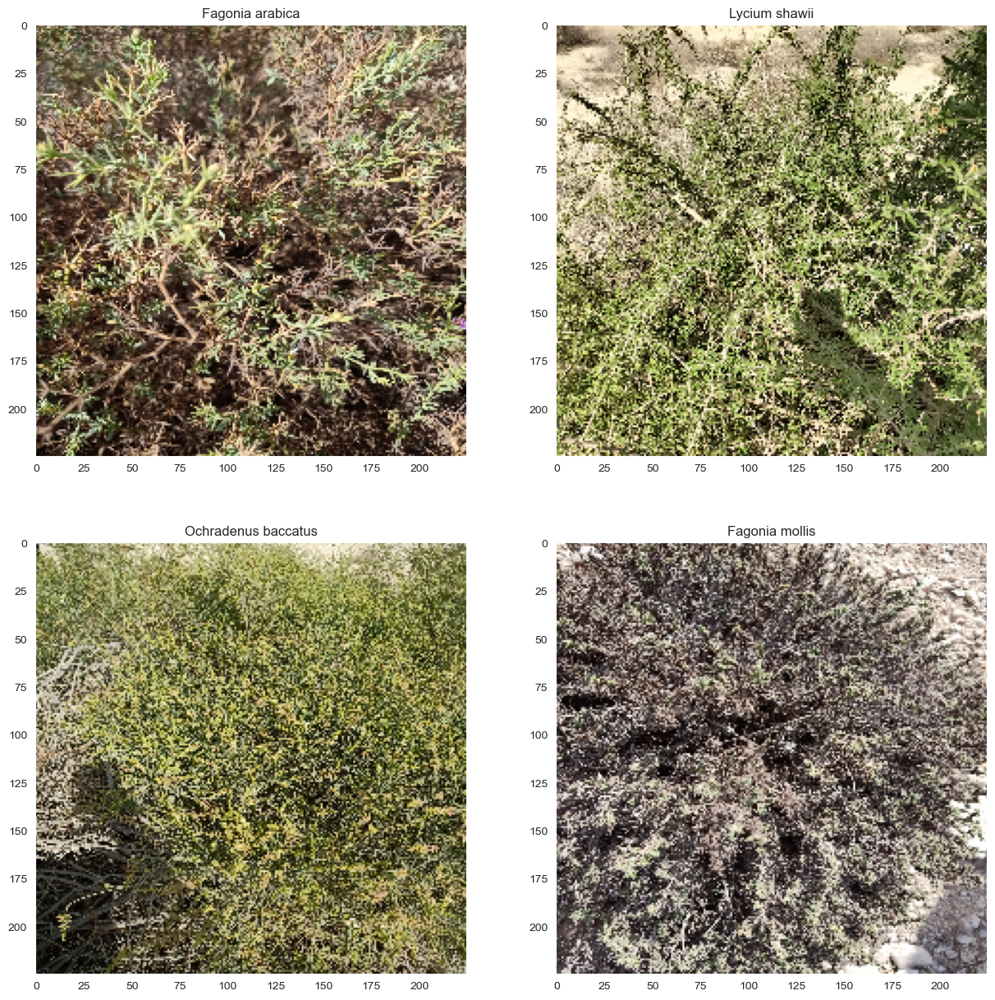

In [440]:
def object_visual(data):
    plt.figure(figsize=(15,15))
    i = 1
    for group in data[0]:
        index = np.random.choice(np.where(np.array(data[1]['class'])==group)[0])
        plt.subplot(2, (len(data[0]))//2, i), plt.imshow(data[1]['images'][index]), plt.title(group), plt.grid(False) 
        i+=1
        
object_visual((classes , data))

# Data preprocessing

**1. create a tf.data.Dataset for training and validation.**

In [516]:
BATCH_SIZE = 32 
IMG_SIZE = (224,224) #resizing
path_dir = '/Users/Downloads/MyAlbums/الكيلو ٨'

In [518]:
train_dataset, validation_dataset = tf.keras.utils.image_dataset_from_directory(path_dir,
                                                            shuffle=True,
                                                            validation_split=0.4,
                                                            subset='both',
                                                            batch_size=BATCH_SIZE,
                                                            seed = 1,                    
                                                            image_size=IMG_SIZE,
                                                            label_mode='categorical')

Found 968 files belonging to 4 classes.
Using 581 files for training.
Using 387 files for validation.


**Plant species classes**

In [521]:
class_names = train_dataset.class_names
class_names

['Fagonia arabica', 'Fagonia mollis', 'Lycium shawii', 'Ochradenus baccatus']

**Show examples from the Plant species classes**

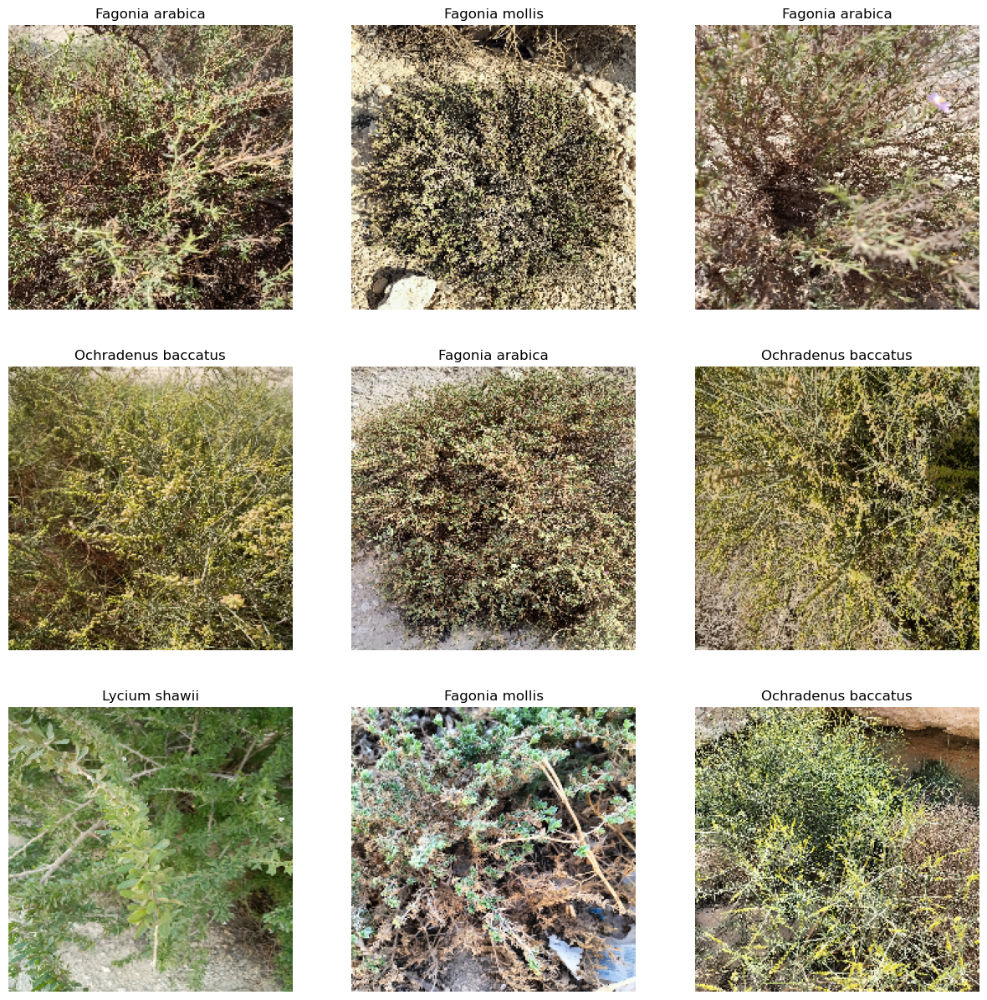

In [524]:
plt.figure(figsize=(15,15))
for plant_imgs, plant_label in train_dataset.take(1):
    for i in range(9):
        img = plant_imgs[i].numpy().astype('uint8')
        label = plant_label[i]
        plt.subplot(3,3,i+1)
        plt.imshow(img)
        plt.title(class_names[(np.where(label==1))[0][0]])
        plt.axis('off')

**Create a test dataset by transferring 20% of the batches from the validation dataset into the test dataset.**

In [526]:
val_batches = validation_dataset.cardinality()
test_dataset = validation_dataset.take(val_batches//5)
validation_dataset = validation_dataset.skip(val_batches//5)

In [527]:
val_batches = tf.data.experimental.cardinality(validation_dataset)
test_dataset = validation_dataset.take(val_batches // 5)
validation_dataset = validation_dataset.skip(val_batches // 5)

In [528]:
print('Number of validation batches: %d' % validation_dataset.cardinality())
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset))

Number of validation batches: 9
Number of test batches: 2


## Configure the dataset for performance

**Use buffered prefetching to load images from disk without having I/O become blocking.**
- The number of elements to prefetch should be equal to (or possibly greater than) the number of batches consumed by a single training step.
- We could either manually tune this value, or set it to `tf.data.AUTOTUNE`, which will prompt the `tf.data` runtime to tune the value dynamically at runtime.

In [535]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

## Data Augmentation

In [538]:
data_augmentation = tf.keras.Sequential([
                                        tf.keras.layers.RandomFlip('horizontal'),
                                        tf.keras.layers.RandomRotation(0.2)])

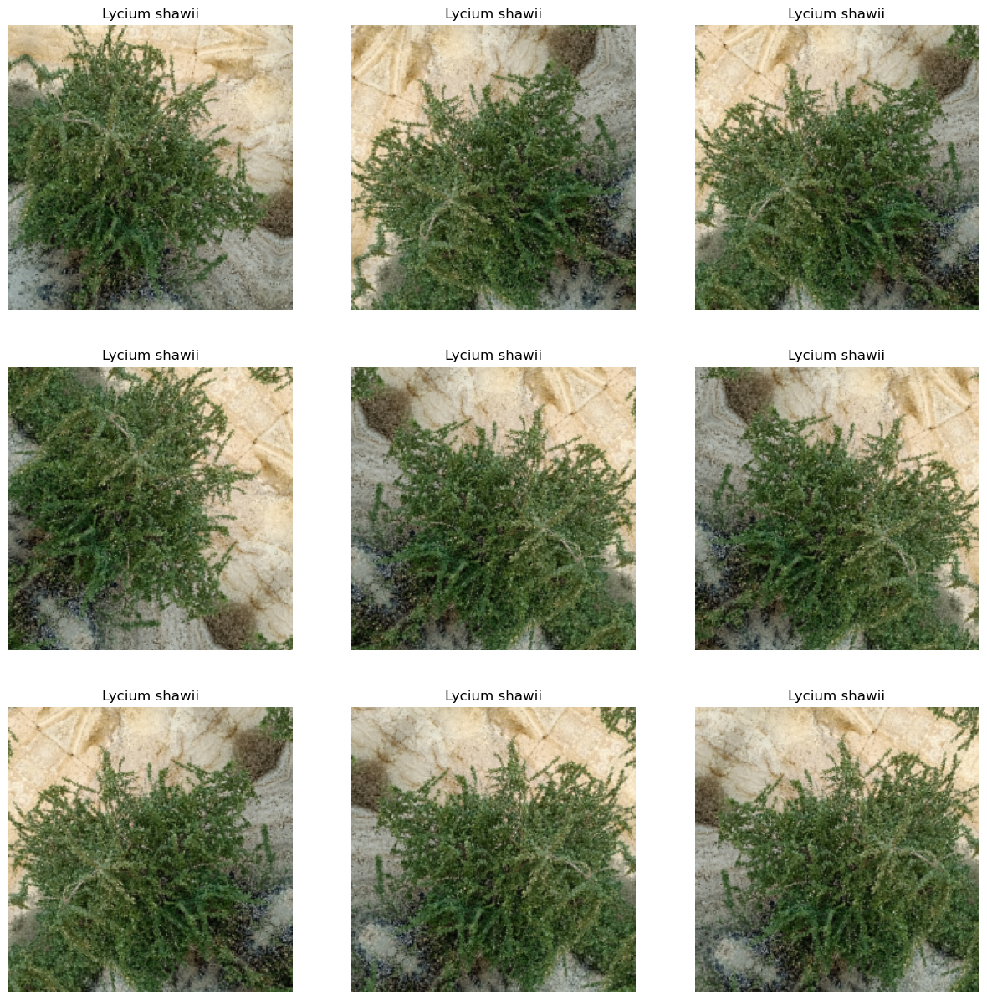

In [540]:
for images, labels in train_dataset.take(1):
    first_image_label = class_names[np.where(labels[0]==1)[0][0]]
    first_image = tf.expand_dims(images[0], 0)
    
    plt.figure(figsize=(15,15))
    for i in range(9):
        augmented_image = data_augmentation(first_image)
        plt.subplot(3,3, i+1)
        plt.title(first_image_label)
        plt.imshow(augmented_image[0]/255)
        plt.axis('off')

- Once the data is prepared for training, we will proceed to build and fine-tune the model.

# Transfer learning & fine-tuning

- We will use a transfer learning approach to build and fine-tune the model.
- Transfer learning consists of taking features learned on one problem, and leveraging them on a new, similar problem.
- We will use the MobileNetV2 architecture with weights pretrained on the ImageNet dataset.
- ImageNet dataset is a large dataset consisting of 1.4M images and 1000 classes. 

**Some notes and requirements for tf.keras.applications.MobileNetV2 function**

- MobileNets support any input size greater than 32 x 32, with larger image sizes offering better performance.
- This function returns a Keras image classification model, optionally loaded with weights pre-trained on ImageNet.
- Reference: [MobileNetV2: Inverted Residuals and Linear Bottlenecks](
    https://arxiv.org/abs/1801.04381) (CVPR 2018)
- Note: each Keras Application expects a specific kind of input preprocessing.
- For MobileNetV2, call `keras.applications.mobilenet_v2.preprocess_input` on your inputs before passing them to the model. `mobilenet_v2.preprocess_input` will scale input pixels between -1 and 1.
- **Args:**
    - **input_shape:** Optional shape tuple, only to be specified if `include_top` is `False` (otherwise the input shape has to be `(224, 224, 3)`. Defaults to `None`.
    - **include_top:** Boolean, whether to include the fully-connected layer at the top of the network. Defaults to `True`.
    - pooling: Optional pooling mode for feature extraction when `include_top`
        is `False`.
        - `None` (default) means that the output of the model will be
            the 4D tensor output of the last convolutional block.
        - `avg` means that global average pooling
            will be applied to the output of the
            last convolutional block, and thus
            the output of the model will be a 2D tensor.
        - `max` means that global max pooling will be applied.
    - classes: Optional number of classes to classify images into, only to be specified if `include_top` is `True`, and if no `weights` argument is specified. Defaults to `1000`.
    - classifier_activation: A `str` or callable. The activation function to use on the "top" layer. Ignored unless `include_top=True`. Set `classifier_activation=None` to return the logits of the "top" layer. When loading pretrained weights, `classifier_activation` can only be `None` or `"softmax"`.

In [546]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

### **Create the base model from the pre-trained model MobileNet V2(feature extractor)**

- We will use the bottleneck layer features, as they retain more generality compared to the final/top layer.

In [550]:
IMG_SHAPE

(224, 224, 3)

In [552]:
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

**This feature extractor converts each 224x224x3 image into a 7x7x1280 block of features.**

In [555]:
image_batch, label_batch = next(iter(train_dataset))
batch_features = base_model(image_batch)
batch_features.shape # 32 is the batch size

TensorShape([32, 7, 7, 1280])

### **Freeze the convolutional base**

- We will freeze the convolutional base created from the previous step and to use as a feature extractor.
- Freezing prevents the weights in the base model from being updated during training.

In [559]:
base_model.trainable = False

In [561]:
base_model.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_7[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

- To convert the features to a single 1280-element vector per image, we will use tf.keras.layers.GlobalAveragePooling2D.

In [564]:
global_avg_layer = tf.keras.layers.GlobalAveragePooling2D()
global_avg_layer(batch_features).shape

TensorShape([32, 1280])

**Add a classification head**

In [567]:
prediction_layer = tf.keras.layers.Dense(4, activation='softmax')

### Build the model

- Build the model by chaining together the data augmentation, rescaling, base_model, feature extractor layers and classifier using the Keras Functional API.
- Important note about BatchNormalization layers
    - When we set layer.trainable = False, the BatchNormalization layer will run in inference mode, and will not update its mean and variance statistics.
    - But when we unfreeze a model that contains BatchNormalization layers in order to do fine-tuning, you should keep the BatchNormalization layers in inference mode by passing training = False when calling the base model. Otherwise, the updates applied to the non-trainable weights will destroy what the model has learned.

In [571]:
inputs = tf.keras.Input(shape=(224,224,3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training = False)
x = global_avg_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [573]:
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_3 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         5,124 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,263,108 (8.63 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

### **Compile the mode**

In [587]:
base_learning_rate = 0.0005
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

### **Train the mode**
- **After training for 50 epochs, we will see ~97% accuracy on the validation set.**

In [590]:
initial_epochs = 50

loss0, accuracy0 = model.evaluate(validation_dataset)

9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 539ms/step - accuracy: 0.2040 - loss: 1.5521


In [787]:
print(f"initial loss: {loss0:.2f}")
print(f"initial accuracy: {accuracy0:.2f}")

initial loss: 1.55
initial accuracy: 0.22


In [594]:
history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset)

Epoch 1/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.3012 - loss: 1.4643 - val_accuracy: 0.6023 - val_loss: 0.9841
Epoch 2/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.6612 - loss: 0.8673 - val_accuracy: 0.8263 - val_loss: 0.6857
Epoch 3/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.8265 - loss: 0.5706 - val_accuracy: 0.8649 - val_loss: 0.5437
Epoch 4/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.8780 - loss: 0.4485 - val_accuracy: 0.9151 - val_loss: 0.4413
Epoch 5/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.8941 - loss: 0.3756 - val_accuracy: 0.9073 - val_loss: 0.3844
Epoch 6/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.9229 - loss: 0.3128 - val_accuracy: 0.9266 - val_loss: 0.3434
Epoch 7/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.9459 - loss: 0.2521 - val_accuracy: 0.9266 - val_loss: 0.3120
Epoch 8/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.9585 - loss: 0.2144 - val_accuracy: 0.9421 - val_loss:

**Save the model on my disk**

In [595]:
model.save('pre_tuned.keras')

In [839]:
model =  tf.keras.models.load_model('pre_tuned.keras')

**Learning curves**

In [813]:
model_metrices = history.history.keys()
print(list(model_metrices))

['accuracy', 'loss', 'val_accuracy', 'val_loss']


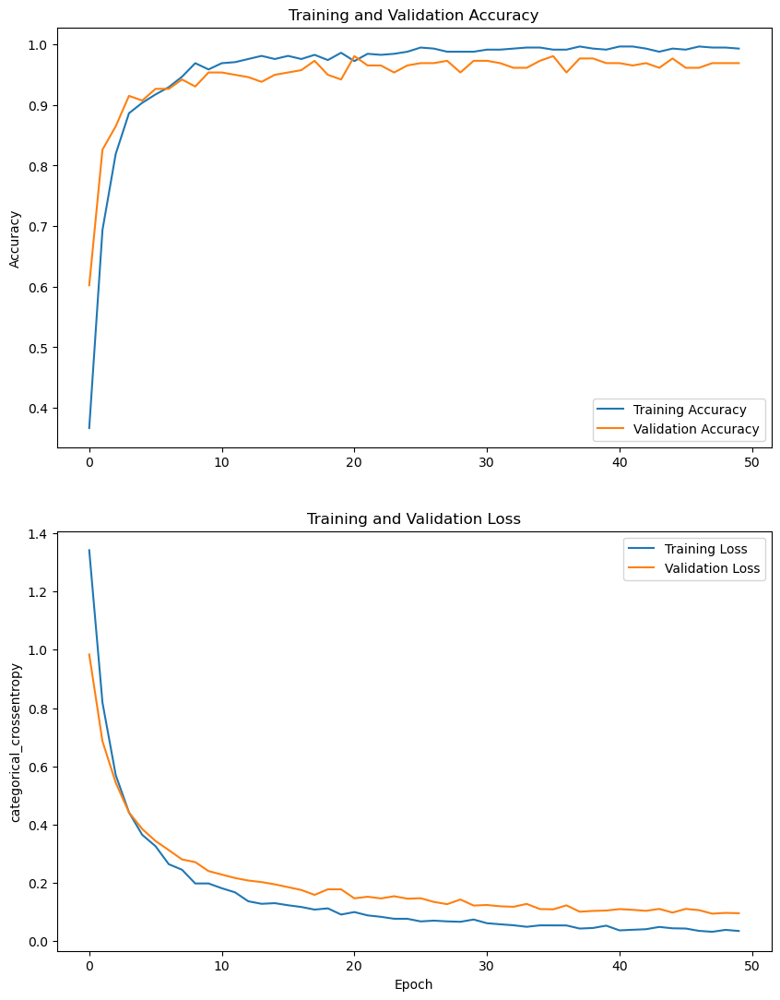

In [843]:
train_acc = history.history['accuracy'][:50]
val_acc = history.history['val_accuracy'][:50]
train_loss = history.history['loss'][:50]
val_loss = history.history['val_loss'][:50]

plt.figure(figsize=(10,13))

plt.subplot(2,1,1)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')

plt.subplot(2,1,2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('categorical_crossentropy')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')

plt.show()

### **Fine tuning**
- We will train (or "fine-tune") the weights of the top 14 layers of the pre-trained model alongside the training of the classifier you added.
- Important note : should use learning rate lower than base_learning_rate to avoid overfitting.

**- Un-freeze the top 14 layers of the base_model**

In [642]:
model.layers[2].trainable = True

In [644]:
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_3 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         5,124 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,263,108 (8.63 MB)

 Trainable params: 2,228,996 (8.50 MB)

 Non-trainable params: 34,112 (133.25 KB)

Let's take a look to see how many layers are in the base model


In [646]:
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  154


In [653]:
fine_tune_at = 140

**Freeze all the layers before the layer in this index : `fine_tune_at` and we will fine-tune from this layer onwards.**

In [655]:
for layer in model.layers[2].layers[:fine_tune_at]:
  layer.trainable = False

In [657]:
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_3 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         5,124 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,263,108 (8.63 MB)

 Trainable params: 1,045,124 (3.99 MB)

 Non-trainable params: 1,217,984 (4.65 MB)

### Compile the model for fine_tuning

In [659]:
model.compile(loss='categorical_crossentropy',
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              metrics=['accuracy'])

### Train and fine-tune the top layers of the model to learn high-level features specific to our dataset.

In [661]:
fine_tune_epochs = 50
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=len(history.epoch),
                         validation_data=validation_dataset)

Epoch 51/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.9184 - loss: 0.2736 - val_accuracy: 0.8996 - val_loss: 0.2573
Epoch 52/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.9808 - loss: 0.1064 - val_accuracy: 0.9112 - val_loss: 0.2510
Epoch 53/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.9914 - loss: 0.0641 - val_accuracy: 0.9459 - val_loss: 0.1192
Epoch 54/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.9907 - loss: 0.0402 - val_accuracy: 0.9344 - val_loss: 0.1365
Epoch 55/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.9945 - loss: 0.0346 - val_accuracy: 0.9266 - val_loss: 0.2000
Epoch 56/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.9933 - loss: 0.0237 - val_accuracy: 0.9575 - val_loss: 0.0809
Epoch 57/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.9971 - loss: 0.0205 - val_accuracy: 0.9691 - val_loss: 0.0795
Epoch 58/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.9981 - loss: 0.0188 - val_accuracy: 0.

In [662]:
model.save('after_tuned.keras')

In [663]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

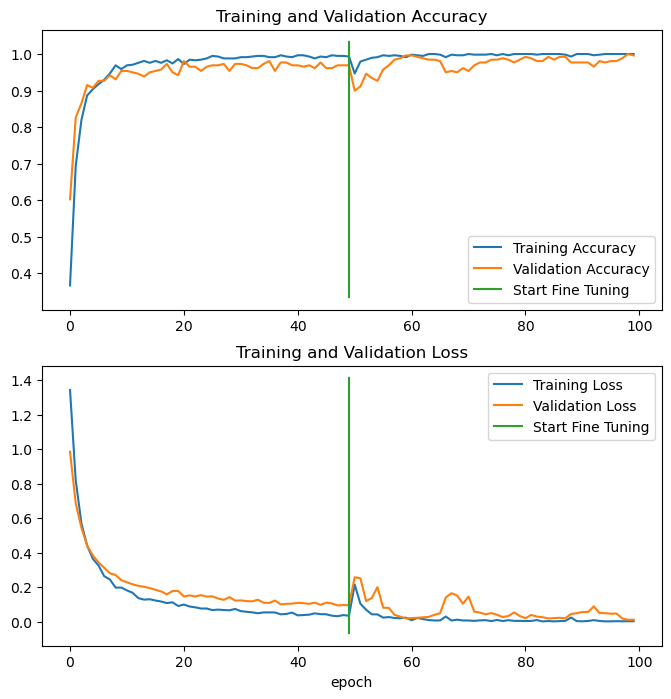

In [893]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### **Evaluation and prediction**

In [785]:
loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 389ms/step - accuracy: 0.9792 - loss: 0.0182
Test accuracy : 0.984375


### **Conclusion**
- The model achieves 100% accuracy on the training dataset, approximately 99.6% on the validation dataset, and around 98.5% on the unseen test dataset. 

### **Show some of the model’s predictions.​**

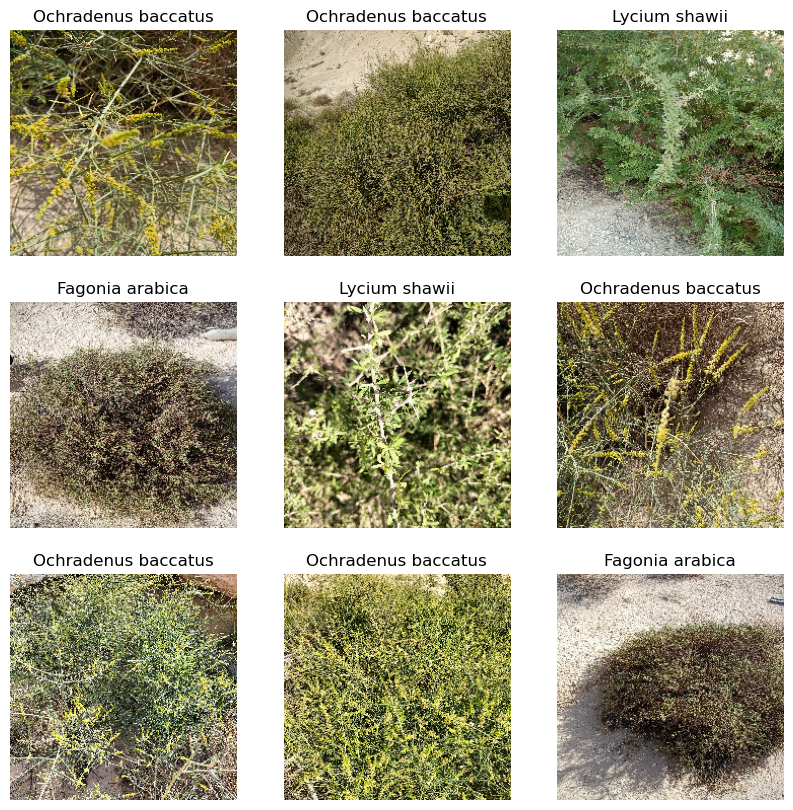

In [900]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)
predictions = np.argmax(tf.where(predictions < 0.5, 0, 1),axis=1)


plt.figure(figsize=(10, 10))
for i in range(9):
  plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predictions[i]])
  plt.axis("off")